# Análisis de Datos Meteorológicos de Australia

    ## 1. Introducción y Configuración

    Este notebook analiza datos meteorológicos de Australia para predecir la probabilidad de lluvia. Los datos provienen de múltiples estaciones meteorológicas y contienen mediciones diarias de variables climáticas.

In [3]:
#Instalacion de Librerias
# %pip install numpy==1.23.5 pandas==2.2.2 scikit-learn==1.2.2 xgboost seaborn matplotlib IPython==7.34.0 pyarrow  requests plotly==5.18.0 nbformat==5.7.0

In [4]:
# ### 1.1 Importación de Librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Agregarmos imports librerias adicionales
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Configuración para visualizaciones
plt.style.use('seaborn-v0_8')  # Versión correcta del estilo
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.family'] = 'sans-serif'

### 1.1 Importación de Librerías
    Comenzamos importando las librerías necesarias para nuestro análisis:
    - pandas: Para manipulación de datos
    - numpy: Para cálculos numéricos
    - matplotlib y seaborn: Para visualizaciones
    - sklearn: Para modelos predictivos

In [5]:
# ## 2. Carga y Exploración Inicial de Datos
# Cargar datos desde el archivo CSV
df = pd.read_csv('weatherAUS.csv')

# Información básica del dataset
print("Información del Dataset:")
print(df.info())

# Primeras filas
print("\nPrimeras filas del dataset:")
print(df.head())

# Estadísticas descriptivas
print("\nEstadísticas descriptivas:")
print(df.describe())

# Valores faltantes
print("\nValores faltantes:")
print(df.isnull().sum())


Información del Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Clou

## 2. Carga y Exploración Inicial de Datos
    ### 2.1 Estructura del Dataset
    El conjunto de datos incluye las siguientes variables principales:
    - Fecha: Fecha de observación.
    - Ubicación: Estación meteorológica.
    - Variables climáticas: Temperatura, lluvia, viento, etc.
    - Variable objetivo: Lluvia al día siguiente (RainTomorrow).
    ### 2.2 Análisis Inicial
    Examinamos:
    - Dimensiones del dataset.
    - Tipos de datos.
    - Valores faltantes.
    - Estadísticas descriptivas básicas.

In [6]:
# 3. Preprocesamiento y Análisis Temporal
# Convertir fecha a datetime y crear nuevas características temporales
df['Date'] = pd.to_datetime(df['Date'])
df['Mes'] = df['Date'].dt.month
df['Dia_semana'] = df['Date'].dt.day_name()
df['Estacion'] = df['Date'].dt.quarter
df['Año'] = df['Date'].dt.year

# Manejar valores faltantes en columnas numéricas
columnas_numericas = df.select_dtypes(include=['float64', 'int64']).columns
df[columnas_numericas] = df[columnas_numericas].fillna(df[columnas_numericas].mean())

# Convertir variables categóricas
columnas_categoricas = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
df[columnas_categoricas] = df[columnas_categoricas].fillna('Desconocido')


## 3. Preprocesamiento de Datos
    ### 3.1 Limpieza de Datos
    - Conversión de tipos de datos
    - Manejo de valores faltantes
    - Codificación de variables categóricas
    ### 3.2 Transformación de Variables
    - Normalización de variables numéricas
    - Creación de nuevas características
    - Preparación para modelado


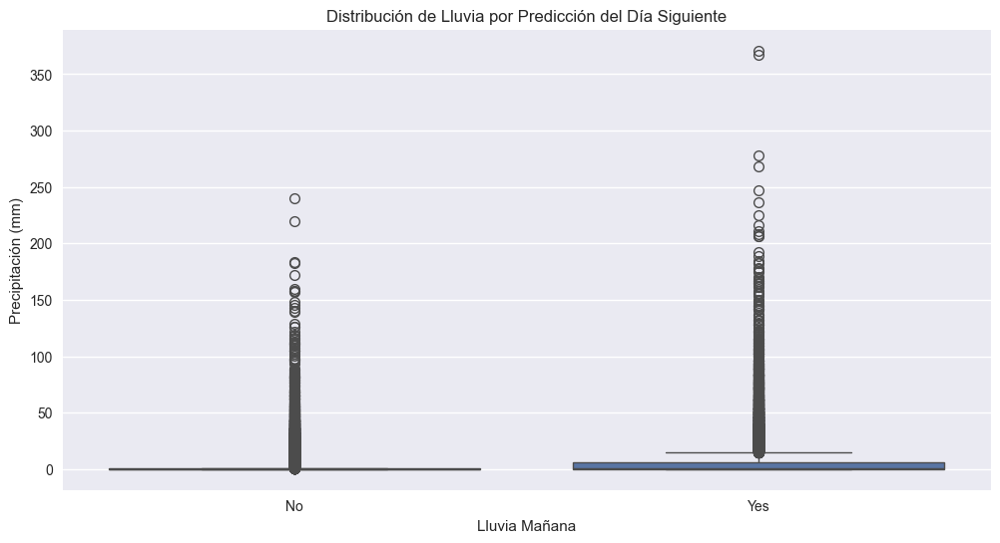

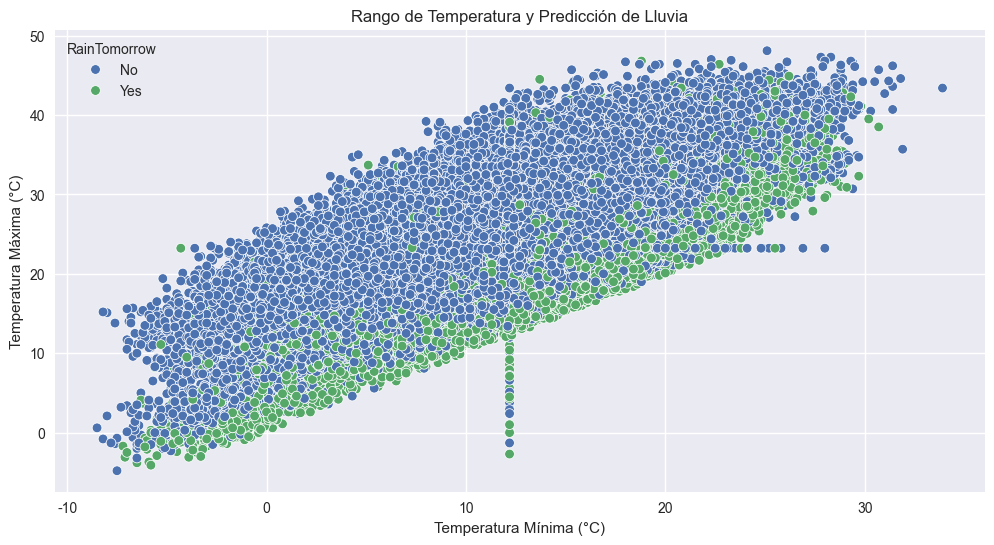

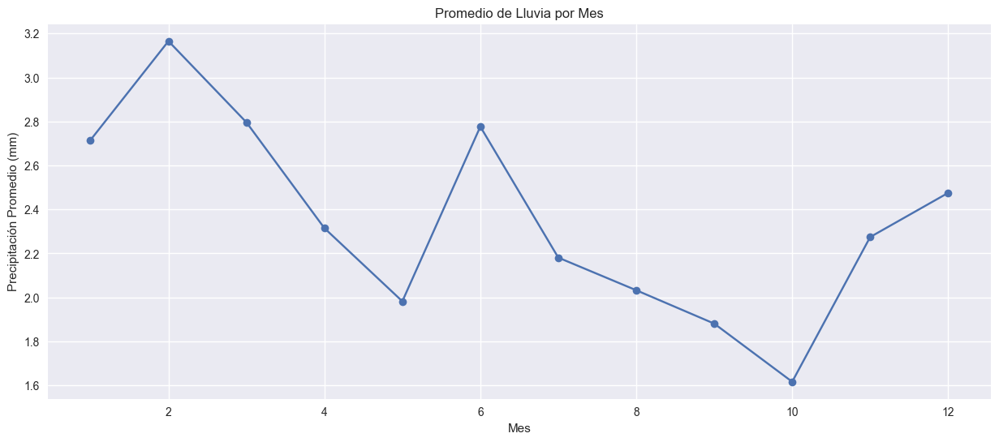

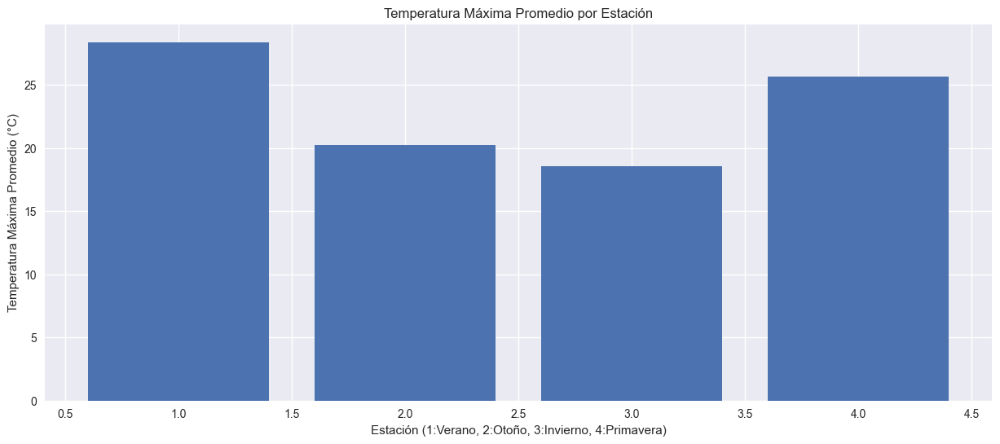

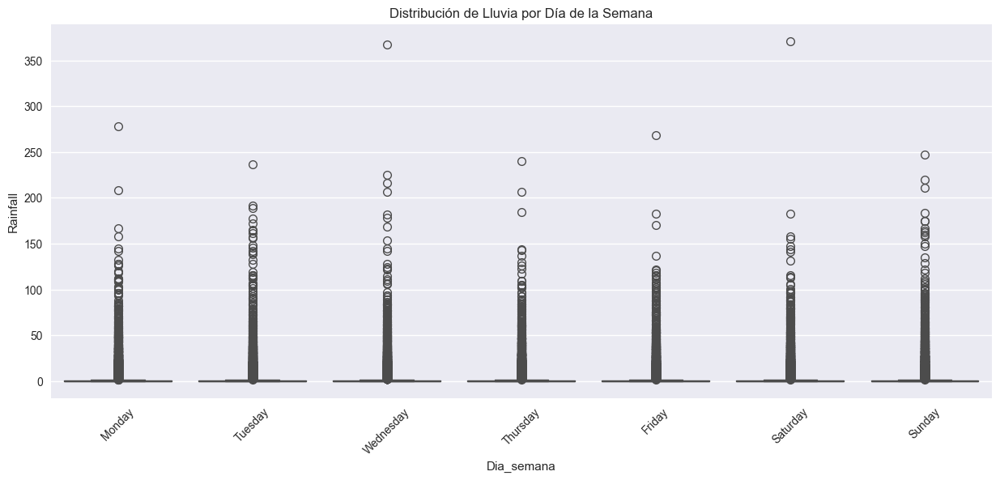

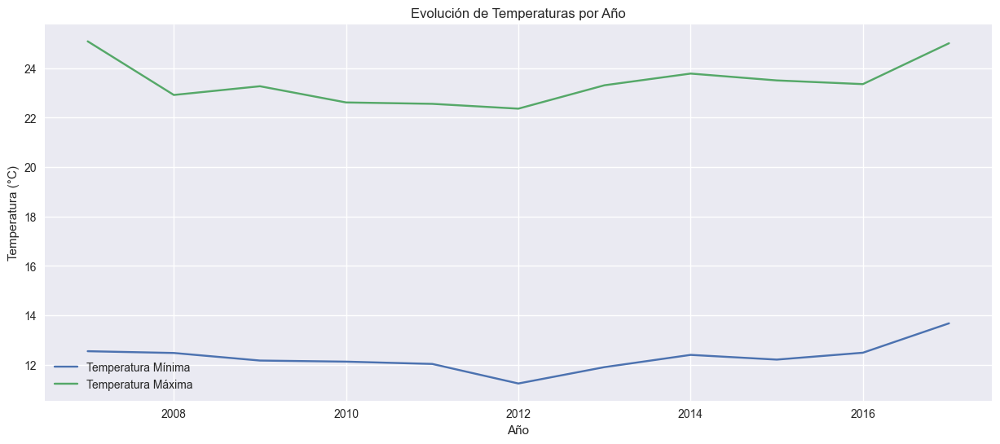

In [7]:
# Crear visualizaciones para patrones climáticos clave
plt.figure(figsize=(12, 6))
sns.boxplot(x='RainTomorrow', y='Rainfall', data=df)
plt.title('Distribución de Lluvia por Predicción del Día Siguiente')
plt.xlabel('Lluvia Mañana')
plt.ylabel('Precipitación (mm)')
plt.show()

# Análisis de temperatura
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='MinTemp', y='MaxTemp', hue='RainTomorrow')
plt.title('Rango de Temperatura y Predicción de Lluvia')
plt.xlabel('Temperatura Mínima (°C)')
plt.ylabel('Temperatura Máxima (°C)')
plt.show()

# 4.1 Promedio de lluvia por mes
plt.figure(figsize=(15, 6))
lluvia_mensual = df.groupby('Mes')['Rainfall'].mean()
plt.plot(lluvia_mensual.index, lluvia_mensual.values, marker='o')
plt.title('Promedio de Lluvia por Mes')
plt.xlabel('Mes')
plt.ylabel('Precipitación Promedio (mm)')
plt.grid(True)
plt.show()

# 4.2 Temperatura máxima promedio por estación
plt.figure(figsize=(15, 6))
temp_estacion = df.groupby('Estacion')['MaxTemp'].mean()
plt.bar(temp_estacion.index, temp_estacion.values)
plt.title('Temperatura Máxima Promedio por Estación')
plt.xlabel('Estación (1:Verano, 2:Otoño, 3:Invierno, 4:Primavera)')
plt.ylabel('Temperatura Máxima Promedio (°C)')
plt.show()

# 4.3 Distribución de lluvia por día de la semana
plt.figure(figsize=(15, 6))
sns.boxplot(x='Dia_semana', y='Rainfall', data=df)
plt.title('Distribución de Lluvia por Día de la Semana')
plt.xticks(rotation=45)
plt.show()

# 4.4 Evolución de temperatura a lo largo de los años
temp_anual = df.groupby('Año')[['MinTemp', 'MaxTemp']].mean()
plt.figure(figsize=(15, 6))
plt.plot(temp_anual.index, temp_anual['MinTemp'], label='Temperatura Mínima')
plt.plot(temp_anual.index, temp_anual['MaxTemp'], label='Temperatura Máxima')
plt.title('Evolución de Temperaturas por Año')
plt.xlabel('Año')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.show()

## 4. Análisis Exploratorio de Datos (EDA)
    ### 4.1 Análisis Univariado
    Estudiamos la distribución de variables clave:
    - Temperatura
    - Precipitaciones
    - Humedad
    - Presión atmosférica

    ### 4.2 Análisis Bivariado
    Exploramos relaciones entre:
    - Temperatura y lluvia
    - Humedad y precipitaciones
    - Presión y condiciones climáticas

    ### 4.3 Patrones Temporales
    - Tendencias estacionales
    - Patrones mensuales
    - Variaciones anuales

In [8]:
# Seleccionar características para el modelo
caracteristicas = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm', 
                  'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

X = df[caracteristicas]
y = (df['RainTomorrow'] == 'Yes').astype(int)

# Dividir los datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



Resumen por Estación:
          Rainfall    MaxTemp    MinTemp
Estacion                                
1         2.874013  28.391723  16.914152
2         2.352472  20.231656  10.011761
3         2.033454  18.581492   7.955464
4         2.110277  25.683111  13.801676

Días de lluvia por mes:
Mes  RainToday  
1    No             10380
     Yes             2417
     Desconocido      124
2    No              8260
     Yes             2151
     Desconocido      114
3    No             10097
     Yes             2788
     Desconocido      151
4    No              8787
     Yes             2423
     Desconocido       96
5    No             10075
     Yes             2856
     Desconocido      124
6    No              9034
     Yes             3224
     Desconocido      131
7    No              8513
     Yes             3147
     Desconocido      119
8    No              8707
     Yes             2941
     Desconocido      114
9    No              8669
     Yes             2553
     Desconoc

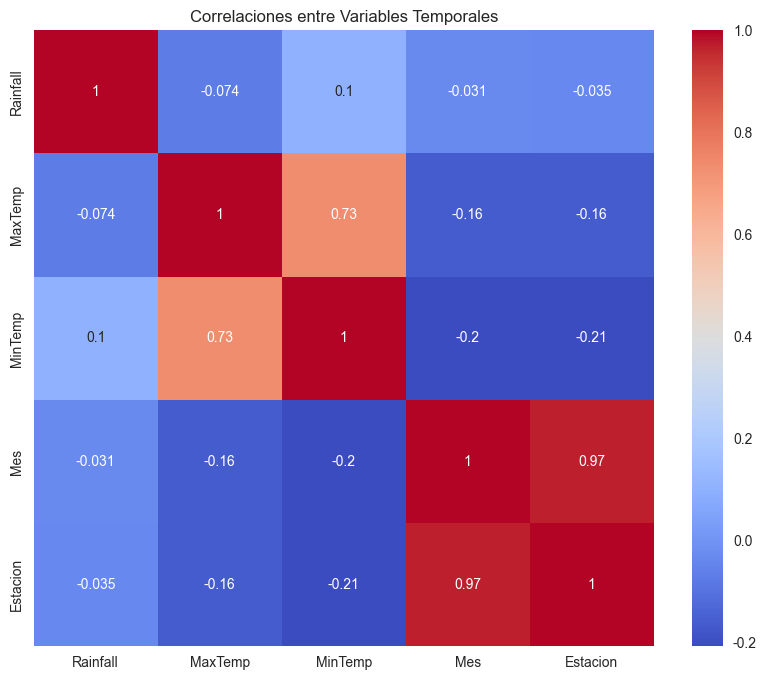

In [9]:
# 5. Estadísticas por Período

# 5.1 Resumen por estación
print("\nResumen por Estación:")
print(df.groupby('Estacion')[['Rainfall', 'MaxTemp', 'MinTemp']].mean())

# 5.2 Días lluviosos por mes
dias_lluvia = df.groupby('Mes')['RainToday'].value_counts()
print("\nDías de lluvia por mes:")
print(dias_lluvia)

# 5.3 Temperaturas extremas por año
extremos_temp = df.groupby('Año').agg({
    'MaxTemp': ['max', 'mean'],
    'MinTemp': ['min', 'mean']
})
print("\nTemperaturas extremas por año:")
print(extremos_temp)

# 6. Correlaciones temporales
correlaciones = df[['Rainfall', 'MaxTemp', 'MinTemp', 'Mes', 'Estacion']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlaciones, annot=True, cmap='coolwarm')
plt.title('Correlaciones entre Variables Temporales')
plt.show()

## 5. Modelado Predictivo

### 5.1 Preparación para el Modelado
- Selección de características
- División de datos en entrenamiento y prueba
- Escalado de variables

### 5.2 Evaluación de Modelos
- Métricas de rendimiento
- Validación cruzada
- Análisis de resultados

In [10]:
def crear_dashboard_meteorologico():
    # Crear la estructura del dashboard con subplots
    fig = make_subplots(
        rows=5, cols=2,
        specs=[
            [{"secondary_y": True}, {"type": "domain"}],
            [{"colspan": 2}, None],
            [{"type": "xy"}, {"type": "xy"}],
            [{"type": "xy"}, {"type": "xy"}],
            [{"type": "indicator"}, {"type": "indicator"}]
        ],
        subplot_titles=(
            "Temperaturas por Estación", "Distribución de Días Lluviosos",
            "Evolución Temporal de Precipitaciones",
            "Distribución de Lluvia por Predicción", "Rango de Temperatura y Predicción",
            "Promedio de Lluvia por Mes", "Evolución de Temperaturas por Año",
            "Temperatura Máxima", "Temperatura Mínima"
        ),
        vertical_spacing=0.08,
        horizontal_spacing=0.1
    )

    # Datos base
    resumen_estacion = df.groupby('Estacion')[['MaxTemp', 'MinTemp']].mean()
    
    # 1. Temperaturas por estación
    fig.add_trace(
        go.Bar(
            name='Temperatura Máxima',
            x=resumen_estacion.index,
            y=resumen_estacion['MaxTemp'],
            marker_color='orangered'
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            name='Temperatura Mínima',
            x=resumen_estacion.index,
            y=resumen_estacion['MinTemp'],
            mode='lines+markers',
            line=dict(color='skyblue', width=2)
        ),
        secondary_y=True,
        row=1, col=1
    )

    # 2. Días lluviosos por mes
    dias_lluvia = df.groupby(['Mes', 'RainToday']).size().reset_index(name='count')
    
    fig.add_trace(
        go.Pie(
            labels=dias_lluvia['Mes'].unique(),
            values=dias_lluvia[dias_lluvia['RainToday'] == 'Yes']['count'],
            hole=0.4,
            textinfo='label+percent',
            marker_colors=px.colors.qualitative.Set3
        ),
        row=1, col=2
    )

    # 3. Evolución temporal de precipitaciones
    precipitacion_mensual = df.groupby('Mes')['Rainfall'].mean()
    
    fig.add_trace(
        go.Scatter(
            x=precipitacion_mensual.index,
            y=precipitacion_mensual.values,
            mode='lines+markers',
            marker=dict(
                size=10,
                color=precipitacion_mensual.values,
                colorscale='Blues',
                showscale=True
            ),
            name='Precipitación Promedio'
        ),
        row=2, col=1
    )

    # 4. Distribución de lluvia por predicción
    fig.add_trace(
        go.Box(
            x=df['RainTomorrow'],
            y=df['Rainfall'],
            name='Distribución de Lluvia',
            marker_color='lightblue'
        ),
        row=3, col=1
    )

    # 5. Scatter de temperaturas
    fig.add_trace(
        go.Scatter(
            x=df['MinTemp'],
            y=df['MaxTemp'],
            mode='markers',
            marker=dict(
                color=df['RainTomorrow'].map({'Yes': 'blue', 'No': 'red'}),
                size=8,
                opacity=0.6
            ),
            name='Rango de Temperatura'
        ),
        row=3, col=2
    )

    # 6. Promedio de lluvia por mes
    lluvia_mensual = df.groupby('Mes')['Rainfall'].mean()
    fig.add_trace(
        go.Bar(
            x=lluvia_mensual.index,
            y=lluvia_mensual.values,
            name='Lluvia Mensual',
            marker_color='lightblue'
        ),
        row=4, col=1
    )

    # 7. Evolución de temperaturas anuales
    temp_anual = df.groupby('Año')[['MinTemp', 'MaxTemp']].mean()
    fig.add_trace(
        go.Scatter(
            x=temp_anual.index,
            y=temp_anual['MinTemp'],
            mode='lines+markers',
            name='Temp. Mínima',
            line=dict(color='blue')
        ),
        row=4, col=2
    )
    
    fig.add_trace(
        go.Scatter(
            x=temp_anual.index,
            y=temp_anual['MaxTemp'],
            mode='lines+markers',
            name='Temp. Máxima',
            line=dict(color='red')
        ),
        row=4, col=2
    )

    # 8. Indicadores
    fig.add_trace(
        go.Indicator(
            mode="gauge+number",
            value=df['MaxTemp'].max(),
            title={'text': "Temperatura Máxima"},
            gauge={'axis': {'range': [0, df['MaxTemp'].max() + 5]},
                   'bar': {'color': "orangered"}}
        ),
        row=5, col=1
    )

    fig.add_trace(
        go.Indicator(
            mode="gauge+number",
            value=df['MinTemp'].min(),
            title={'text': "Temperatura Mínima"},
            gauge={'axis': {'range': [df['MinTemp'].min() - 5, 30]},
                   'bar': {'color': "skyblue"}}
        ),
        row=5, col=2
    )

    # Menú de selección
    updatemenus = [
        dict(
            buttons=[
                dict(
                    args=[{"visible": [True] * len(fig.data)}],
                    label="Todas las Métricas",
                    method="update"
                ),
                dict(
                    args=[{"visible": [True, True, False, False, False, False, False, False, True, True]}],
                    label="Temperaturas",
                    method="update"
                ),
                dict(
                    args=[{"visible": [False, False, True, True, True, False, True, False, False, False]}],
                    label="Precipitaciones",
                    method="update"
                ),
                dict(
                    args=[{"visible": [False, False, False, False, False, True, False, True, False, False]}],
                    label="Evolución Anual",
                    method="update"
                )
            ],
            direction="down",
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.15,
            yanchor="top"
        )
    ]

    # Actualizar diseño
    fig.update_layout(
        updatemenus=updatemenus,
        title={
            'text': "Dashboard Meteorológico Interactivo",
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': dict(size=24)
        },
        height=1800,
        width=1200,
        showlegend=True,
        template='plotly_white',
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )

    # Actualizar ejes
    fig.update_xaxes(title_text="Estación", row=1, col=1)
    fig.update_yaxes(title_text="Temperatura (°C)", row=1, col=1)
    fig.update_xaxes(title_text="Mes", row=2, col=1)
    fig.update_yaxes(title_text="Precipitación (mm)", row=2, col=1)
    fig.update_xaxes(title_text="Predicción de Lluvia", row=3, col=1)
    fig.update_yaxes(title_text="Precipitación (mm)", row=3, col=1)
    fig.update_xaxes(title_text="Temperatura Mínima (°C)", row=3, col=2)
    fig.update_yaxes(title_text="Temperatura Máxima (°C)", row=3, col=2)
    fig.update_xaxes(title_text="Mes", row=4, col=1)
    fig.update_yaxes(title_text="Precipitación (mm)", row=4, col=1)
    fig.update_xaxes(title_text="Año", row=4, col=2)
    fig.update_yaxes(title_text="Temperatura (°C)", row=4, col=2)

    return fig

# Generar y mostrar dashboard
dashboard = crear_dashboard_meteorologico()
dashboard.show()

# Para Jupyter Notebook específicamente, Guardamos en HTML:
dashboard.write_html("dashboard_meteorologico.html")


## 6. Conclusiones y Recomendaciones
    ### 6.1 Hallazgos Principales
    - Patrones climáticos identificados
    - Variables más influyentes
    - Precisión del modelo

    ### 6.2 Recomendaciones
    - Mejoras potenciales
    - Aplicaciones prácticas
    - Próximos pasos

    ## 7. Referencias y Recursos
    - Fuentes de datos
    - Documentación técnica
    - Herramientas utilizadas